## 语义分割

语义分割(Semantic Segmentation)是图像处理和机器视觉一个重要分支。与分类任务不同，语义分割需要判断图像每个像素点的类别，进行精确分割。

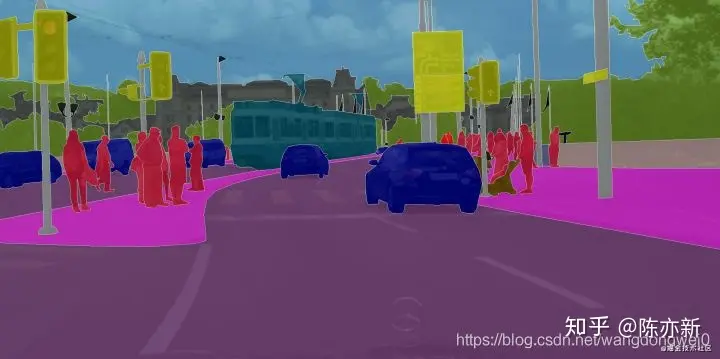

上图为自动驾驶中的移动分割任务的分割结果，可以从一张图片中有效的识别出汽车（深蓝色），行人（红色），红绿灯（黄色），道路（浅紫色）等

## Unet

Unet 发表于 2015 年，属于 FCN 的一种变体。Unet 的初衷是为了解决生物医学图像方面的问题，由于效果确实很好后来也被广泛的应用在语义分割的各个方向，比如卫星图像分割，工业瑕疵检测等。

Unet 跟 FCN 都是 **Encoder-Decoder** 结构，结构简单但很有效。**Encoder 负责特征提取**，你可以将自己熟悉的各种特征提取网络放在这个位置。由于在医学方面，样本收集较为困难，作者为了解决这个问题，应用了图像增强的方法，在数据集有限的情况下获得了不错的精度。

### Unet 网络结构与细节

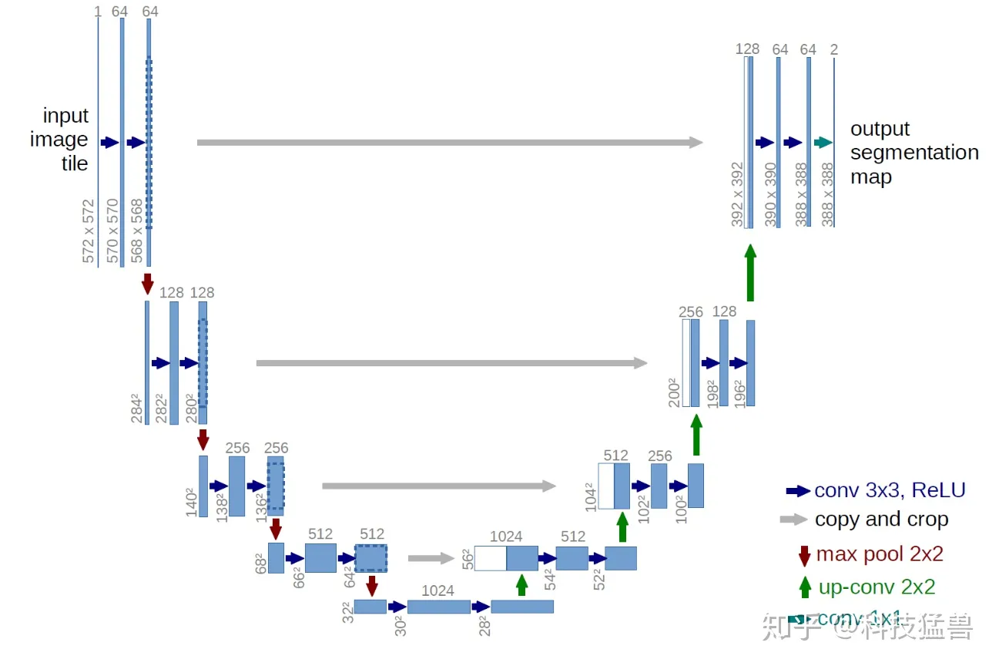

#### encoder

如上图，Unet 网络结构是对称的，形似英文字母 U 所以被称为 Unet。整张图都是由蓝/白色框与各种颜色的箭头组成，其中，**蓝/白色框表示 feature map；蓝色箭头表示 3x3 卷积，用于特征提取；灰色箭头表示 skip-connection，用于特征融合；红色箭头表示池化 pooling，用于降低维度；绿色箭头表示上采样 upsample，用于恢复维度；青色箭头表示 1x1 卷积，用于输出结果**。其中灰色箭头copy and crop中的copy就是concatenate而crop是为了让两者的长宽一致

在Unet论文中是池化4次，比方说一开始的图片是224x224的，那么就会变成112x112，56x56,28x28,14x14四个不同尺寸的特征。然后我们对14x14的特征图做上采样或者反卷积，得到28x28的特征图，这个28x28的特征图与之前的28x28的特征图进行通道伤的拼接concat，然后再对拼接之后的特征图做卷积和上采样，得到56x56的特征图，再与之前的56x56的特征拼接，卷积，再上采样，经过四次上采样可以得到一个与输入图像尺寸相同的224x224的预测结果。

Encoder 由卷积操作和下采样操作组成，文中所用的卷积结构统一为 3x3 的卷积核，**padding 为 0 ，striding 为 1**。没有 padding 所以每次卷积之后 feature map 的 H 和 W 变小了，在 skip-connection 时要注意 feature map 的维度(其实也可以将 padding 设置为 1 避免维度不对应问题)

上面的步骤重复 5 次，最后一次没有 max-pooling，直接将得到的 feature map 送入 Decoder。

#### decoder

feature map 经过 Decoder 恢复原始分辨率，该过程除了卷积比较关键的步骤就是 **upsampling 与 skip-connection**。

Upsampling 上采样常用的方式有两种：**1.FCN 中介绍的反卷积；2. 插值。** 这里介绍文中使用的插值方式。在插值实现方式中，bilinear 双线性插值的综合表现较好也较为常见 。

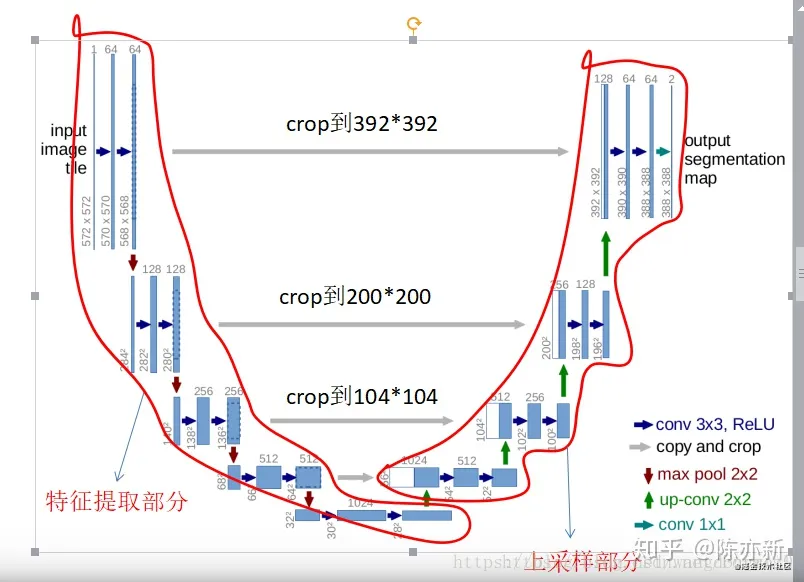

Unet网络非常的简单，前半部分就是特征提取，后半部分是上采样。在一些文献中把这种结构叫做编码器-解码器结构，由于网络的整体结构是一个大些的英文字母U，所以叫做U-net。

* Encoder：左半部分，由两个3x3的卷积层（RELU）再加上一个2x2的maxpooling层组成一个下采样的模块（后面代码可以看出）；
* Decoder：有半部分，由一个上采样的卷积层（去卷积层）+特征拼接concat+两个3x3的卷积层（ReLU）反复构成（代码中可以看出来）；

在当时，Unet相比更早提出的FCN网络，使用**拼接**来作为特征图的融合方式。

* FCN是通过特征图对应像素值的相加来融合特征的；
* U-net通过通道数的拼接，这样可以形成更厚的特征，当然这样会更佳消耗显存；

Unet的好处我感觉是：**网络层越深得到的特征图，有着更大的视野域，浅层卷积关注纹理特征，深层网络关注本质的那种特征，所以深层浅层特征都是有格子的意义的；另外一点是通过反卷积得到的更大的尺寸的特征图的边缘，是缺少信息的，毕竟每一次下采样提炼特征的同时，也必然会损失一些边缘特征，而失去的特征并不能从上采样中找回，因此通过特征的拼接，来实现边缘特征的一个找回。**

### 为什么Unet在医疗图像分割种表现好

* 医疗影像语义较为简单、结构固定。因此语义信息相比自动驾驶等较为单一，因此并不需要去筛选过滤无用的信息。**医疗影像的所有特征都很重要，因此低级特征和高级语义特征都很重要，所以U型结构的skip connection结构（特征拼接）更好派上用场**
* 医学影像的数据较少，获取难度大，数据量可能只有几百甚至不到100，因此如果使用大型的网络例如DeepLabv3+等模型，很容易过拟合。**大型网络的优点是更强的图像表述能力，而较为简单、数量少的医学影像并没有那么多的内容需要表述，因此也有人发现在小数量级中，分割的SOTA模型与轻量的Unet并没有什么优势**
* 医学影像往往是多模态的。比方说ISLES脑梗竞赛中，官方提供了CBF，MTT，CBV等多中模态的数据（这一点听不懂也无妨）。因此**医学影像任务中，往往需要自己设计网络去提取不同的模态特征，因此轻量结构简单的Unet可以有更大的操作空间。**

### 损失函数

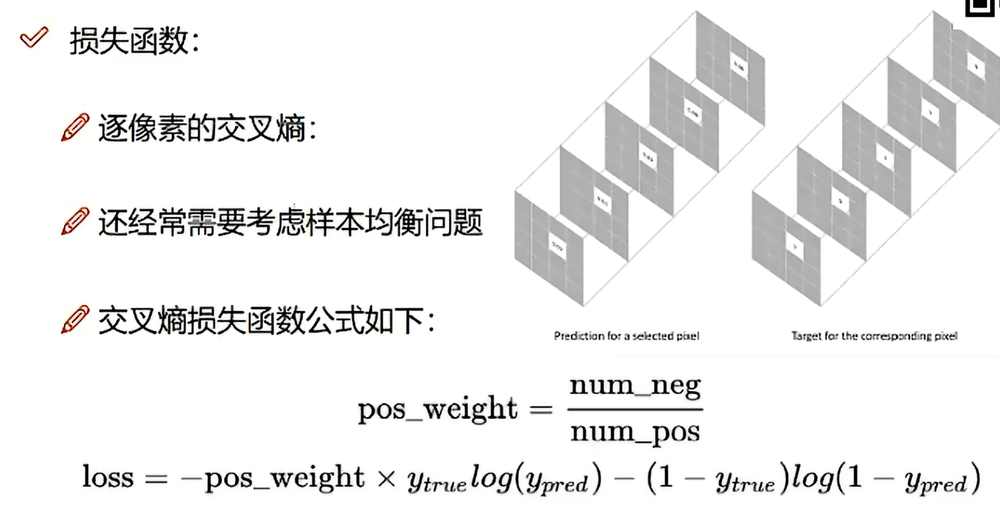

pos_weight是考虑样本均衡结果，某一类样本像素点多，那它的像素点数量比上全部的像素点就会变大，权重就大，loss在交叉熵函数基础上加上pos_weight的权重，平衡样本之间的数量差距

### 评估指标
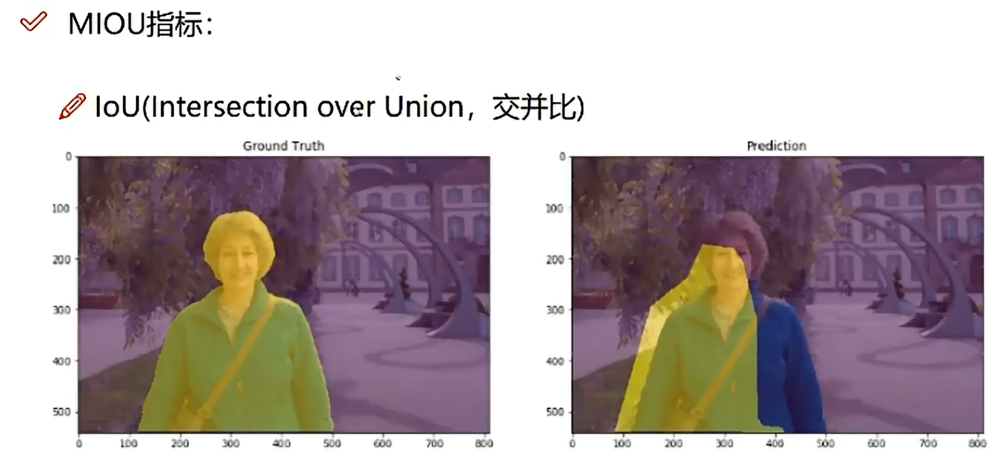
原图像样本和预测样本之间的交并比

## unet++

从上面的分析可见,不同数据集的最优的深度是不一样的, 但是总不能把所有不同深度的U-Net都训练一遍吧，这太耗时间了吧。如果给你一个数据集,训练你的网络,你并不知道网络要多深才算最优,也就是你并不知道不同深度的特征的重要性,那有没有办法设计一个网络使得它能够学习不同深度的特征的重要性呢?

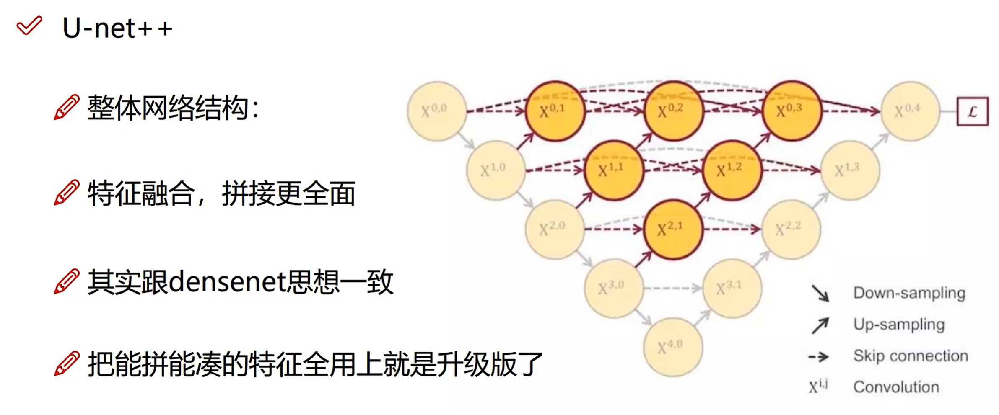

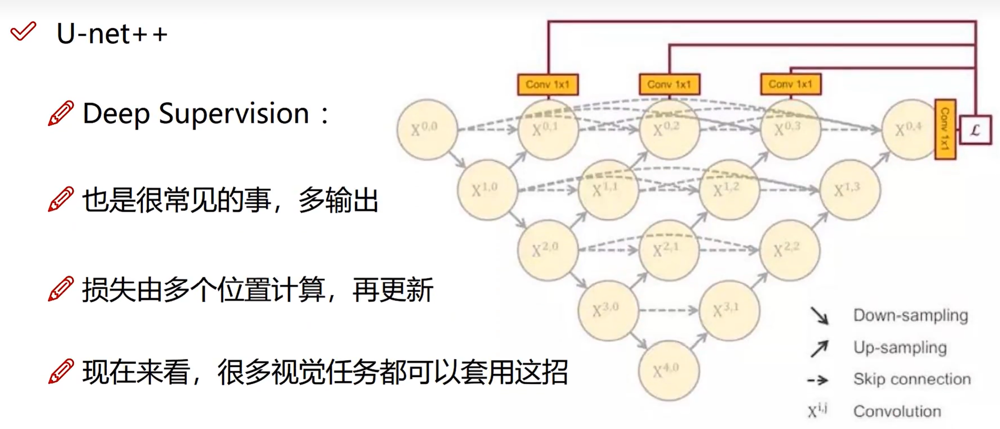

在这个网络里面你都可以找到1～4层的U-Net，它们全部都连在了一起. 这个结构的好处就是我不管你哪个深度的特征有效，我干脆都给你用上，让网络自己去学习不同深度的特征的重要性。第二个好处是它共享了一个特征提取器(我认为这说的是encoder)，也就是你不需要训练一堆U-Net，而是只训练一个encoder，它的不同层次的特征由不同的decoder路径来还原。这个encoder依旧可以灵活的用各种不同的backbone来代替。

**图中从那些横着的，前一个点到后一个点的就是短连接，前一点直接跳到后面好几个点的就是长连接。**

U-Net中的长连接是有必要的，它联系了输入图像的很多信息，有助于还原降采样所带来的信息损失.所以作者给出一个综合长连接和短连接的方案.短连接是为了使模型能够得到训练,然后长连接是获得更多信息.

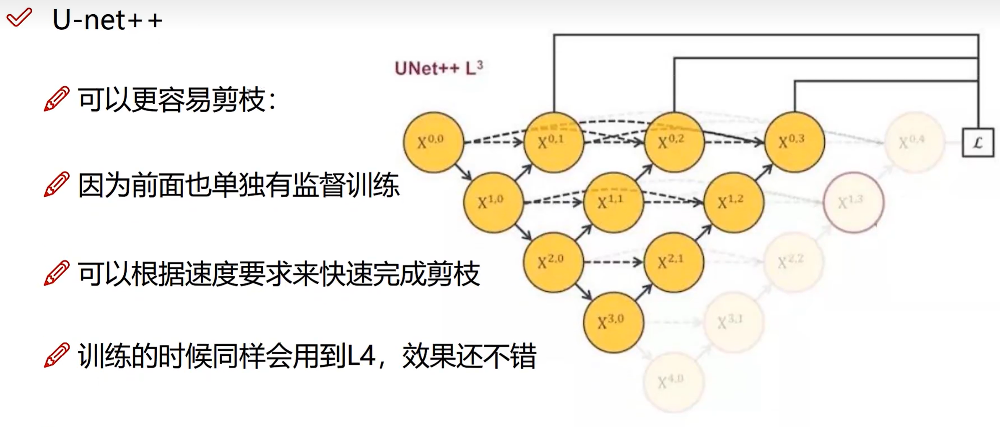

https://zhuanlan.zhihu.com/p/118543343

这个链接有讲unet++ 网络的发展，如何进化过来的，更详细。

### 从上面分析下来,我们可以解读一下为什么UNet++好

解读1:显然它的优势是可以抓取不同层次的特征,将它们通过特征叠加的方式整合. 不同层次的特征，或者说不同大小的感受野，对于大小不一的目标对象的敏感度是不同的，比如，感受野大的特征，可以很容易的识别出大物体的，但是在实际分割中，大物体边缘信息和小物体本身是很容易被深层网络一次次的降采样和一次次升采样给弄丢的，这个时候就可能需要感受野小的特征来帮助.而UNet++就是拥有不同大小的感受野,所以效果好.

解读2:如果你横着看其中一层的特征叠加过程，就像一个去年很火的DenseNet的结构，非常的巧合，原先的U-Net，横着看就很像是Residual的结构，这个就很有意思了，UNet++对于U-Net分割效果提升可能和DenseNet对于ResNet分类效果的提升，原因如出一辙，因此，在解读中作者他们也参考了Dense Connection的一些优势，比方说特征的再利用等等.